# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 28.03.2024

Мягкий дедлайн: 15.04.2024 23:59 MSK

Жёсткий дедлайн: 21.04.2024 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). 

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [71]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

In [72]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [73]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''

        # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵
        D = np.diag(np.sum(X, axis=1))
        L = D - X #Тупо по формулке

        eigenvalues, eigenvectors = np.linalg.eigh(L) #Загуглил
        indices = np.argsort(eigenvalues)
        eigenvectors = eigenvectors[:, indices]

        return eigenvectors[:, :self.n_components]

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [74]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [75]:
data = pd.read_excel('City surface public transport stops.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [76]:
import folium

karta = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(karta)
karta

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [77]:
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    routes = {}
    for kek in data['ID_en']:
        for route in data.loc[data['ID_en'] == kek]['RouteNumbers_en'].values[0].split('; '):
            routes[route] = routes.get(route, [])
            routes[route].append(kek)
    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    return(routes)

from geopy.distance import geodesic

def sort_routes(data, routes):
    sorted_routes = {}
    for route, stops in routes.items():
        cords = []
        for stop_id in stops:
            stop_data = data[data['ID_en'] == stop_id]
            cords.append((stop_id, (stop_data['Latitude_WGS84_en'].iloc[0], stop_data['Longitude_WGS84_en'].iloc[0])))
        
        # Calculate total distance for each stop
        for i, stop1 in enumerate(cords):
            total_distance = 0
            for j, stop2 in enumerate(cords):
                if i != j:
                    total_distance += geodesic(stop1[1], stop2[1]).kilometers
            cords[i] = (stop1[0], stop1[1], total_distance)
        
        cords.sort(key=lambda x: x[2], reverse=True)
        
        # Select starting point for the route (farthest stop)
        start = cords[0][0]
        sorted_route = [start]  # Initialize sorted route with starting point
        
        # Remove the starting point from the list of stops
        cords = cords[1:]
        
        # Select next closest stop until all stops are visited
        while cords:
            closest_stop = None
            min_distance = float('inf')
            for stop_id, coords, _ in cords:
                distance_to_stop = geodesic(data[data['ID_en'] == start][['Latitude_WGS84_en', 'Longitude_WGS84_en']].values[0], coords).kilometers
                if distance_to_stop < min_distance:
                    closest_stop = stop_id
                    min_distance = distance_to_stop
            sorted_route.append(closest_stop)
            cords = [(sid, c, d) for sid, c, d in cords if sid != closest_stop]
            start = closest_stop
        
        sorted_routes[route] = sorted_route
        
    return sorted_routes

        
        

def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    n_samples = len(data['ID_en'])
    matr = np.zeros((n_samples, n_samples))
    dict_inv = {}
    for i in range(len(data)):
        dict_inv[data['ID_en'].iloc[i]] = i
    for key, value in sorted_routes.items():
        for i in range(len(value) - 1):
            matr[dict_inv[value[i]]][dict_inv[value[i+1]]] += 1
            matr[dict_inv[value[i+1]]][dict_inv[value[i]]] += 1
    return matr

In [78]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [79]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=100):
    arr_t = []
    for i in range(len(sorted_routes[route_id])):
        arr_t.append(data[data['ID_en'] == sorted_routes[route_id][i]][['Latitude_WGS84_en', 'Longitude_WGS84_en']].values.tolist()[0])
    coords = arr_t
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

Ну похоже на какую-то красоту!

In [80]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    # YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
    marker_colors = [
        'red', 'blue', 'gray', 'darkred', 'lightred', 'orange', 'beige', 'green',
        'darkgreen', 'lightgreen', 'darkblue', 'lightblue', 'purple', 'darkpurple',
        'pink', 'cadetblue', 'lightgray', 'black' 
    ] #Все цвета, которые нашёл

    karta = folium.Map(location=[55.75215, 37.61819], zoom_start=12)

    for idx, row in data.iterrows():
        cluster_label = labels[idx]
        color = marker_colors[cluster_label]
        folium.CircleMarker(location=[row['Latitude_WGS84_en'], row['Longitude_WGS84_en']],
                            radius=2,
                            color=color).add_to(karta) #Уже было раньше

    return karta

In [81]:
labels = np.random.randint(0, 8, size = len(data))# До восьми, потому что Зелёный - мой любимый цвет

draw_clustered_map(data, labels=labels)

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [82]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
from sklearn.cluster import KMeans, DBSCAN

Cords_data = []
for i in range(len(data)):
    Cords_data.append(data.iloc[i][['Latitude_WGS84_en', 'Longitude_WGS84_en']].tolist())
    
Cords_data = pd.DataFrame(Cords_data, columns=['Latitude_WGS84_en', 'Longitude_WGS84_en'])


# К-средних
kmeans = KMeans(n_clusters=7, random_state=322)
kmeans_labels = kmeans.fit_predict(Cords_data)
kmeans_map = draw_clustered_map(Cords_data, kmeans_labels)

# DBscan
dbscan = DBSCAN(eps=0.0056, min_samples=10)
dbscan_labels = dbscan.fit_predict(Cords_data)
dbscan_map = draw_clustered_map(Cords_data, dbscan_labels)

#Spectral classification

spectral_map = draw_clustered_map(data, labels=GraphClustering(n_clusters=9, n_components=26).fit_predict(adjacency_matrix))



In [83]:
kmeans_map

In [84]:
dbscan_map

In [85]:
spectral_map

Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**
K-means: Рандомно берём k точек и делим плоскость на k областей. прикольно, просто и понятно, но может не сходиться так, как мы хотим.
DBScan: Просто поочерёдное присоединение точек в определённом радиусе. Прикольно, учитывает плотность, однако не справляется с разной плотностью.
Спектральный прикол: Сложно, но тоже прикольно. Использует наибольшее количество информации, что является преимуществом, однако всё больше принимает форму чёрного ящика, где ничего не понятно и неинтерпретируемо. Подходит лучше, так как есть специфицированная информация о маршрутах.

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [86]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
499,business,500.txt,Low-cost airlines hit Eurotunnel,Channel Tunnel operator Eurotunnel has seen s...
432,business,433.txt,Cairn Energy in Indian gas find,"Shares in Cairn Energy rose 3.8% to 1,088 pen..."
1191,politics,296.txt,Tories leave door open for Archer,"The Conservative Party would deal ""sympatheti..."
1712,sport,400.txt,England given tough Sevens draw,England will have to negotiate their way thro...
414,business,415.txt,UK house prices dip in November,"UK house prices dipped slightly in November, ..."


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [87]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [88]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Денис\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Денис\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Денис\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [89]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [90]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)
texts = data['text']

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [91]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

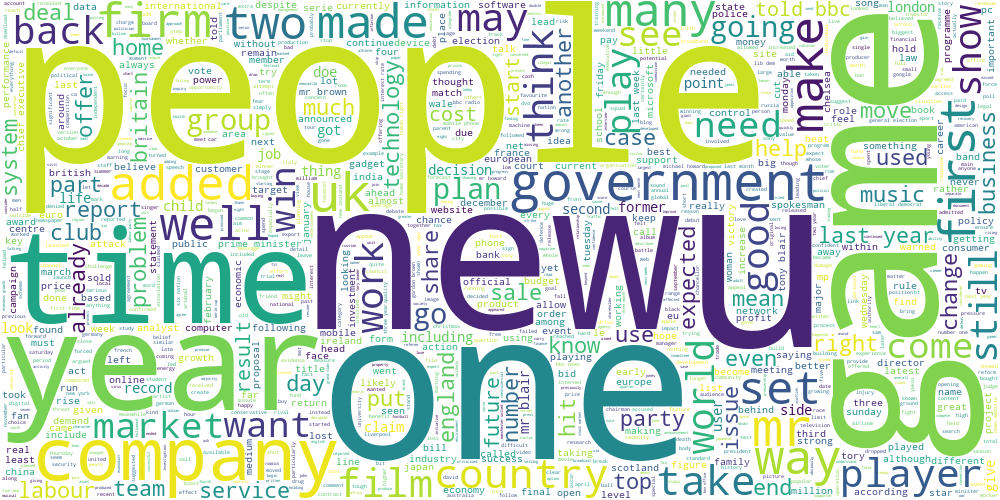

In [92]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**

In [93]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt

tfidf_vectorizer = TfidfVectorizer(min_df=10)
tfidf_matrix = tfidf_vectorizer.fit_transform(texts) #Векторайзер как в препроцессе

kmeans = KMeans(n_clusters=8, random_state=322)
kmeans.fit(tfidf_matrix) #К-средних

data['labels'] = kmeans.labels_

labels = data['labels'].unique()

for i in range(len(labels)):
    draw_wordcloud(data[data['labels'] == labels[i]]['text'])

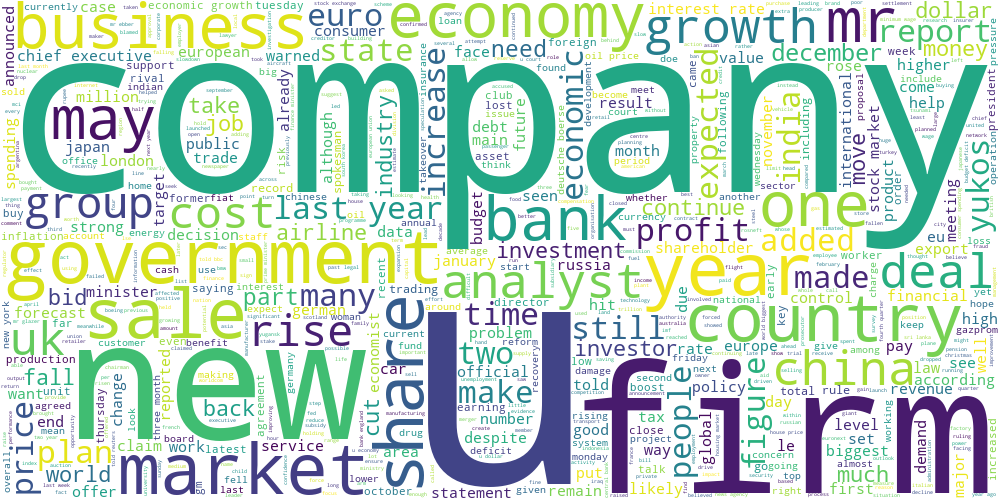

In [94]:
draw_wordcloud(data[data['labels'] == labels[0]]['text']) #Что-то про политику/экономику

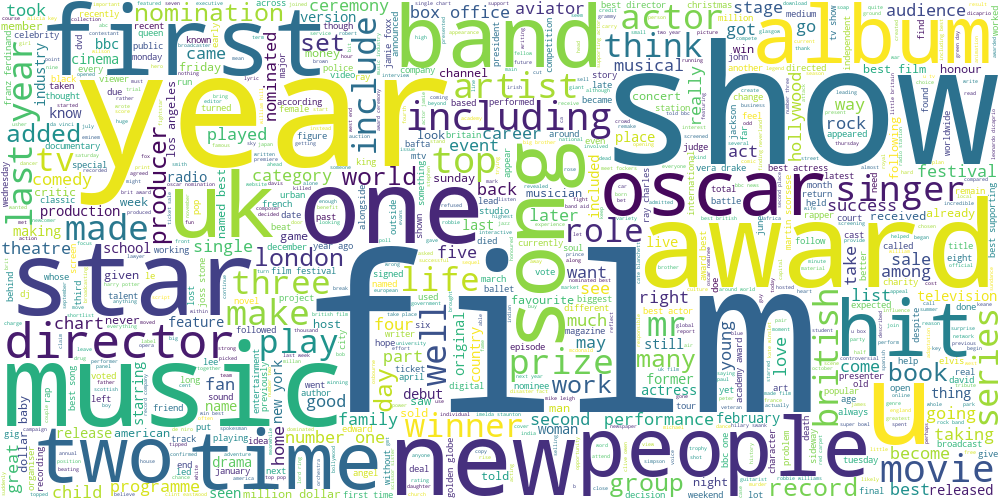

In [95]:
draw_wordcloud(data[data['labels'] == labels[1]]['text'])#Что-то про награждение фильмов, наверное оскар или другая премия

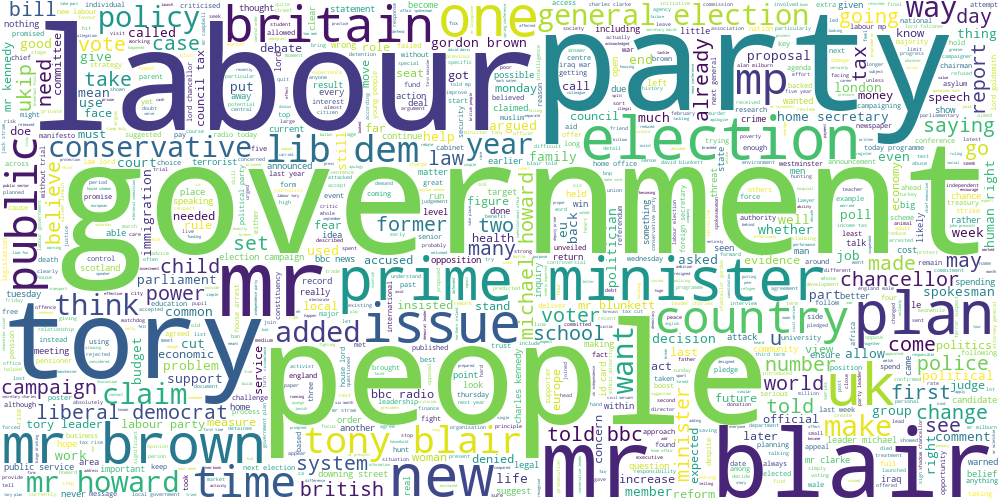

In [96]:
draw_wordcloud(data[data['labels'] == labels[2]]['text'])#Ну тут точно политика, выборы

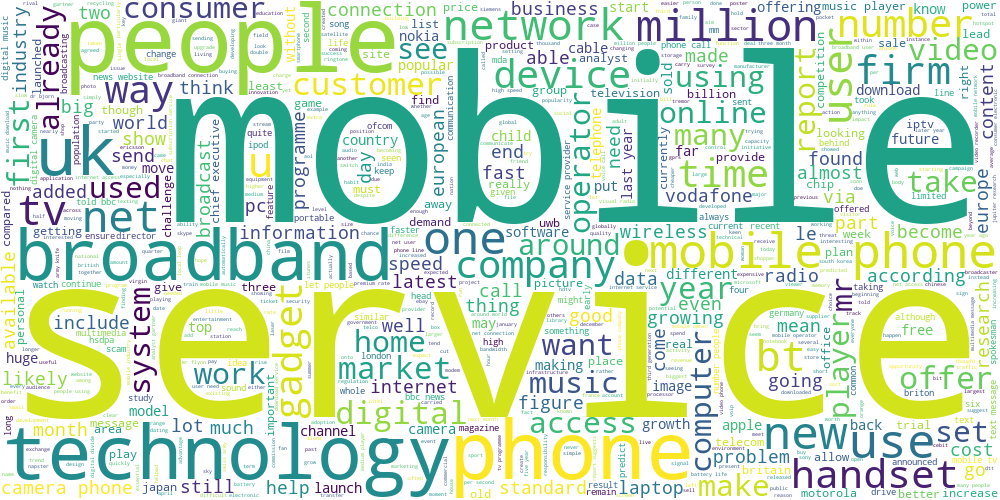

In [97]:
draw_wordcloud(data[data['labels'] == labels[3]]['text'])# Технологии, скорее всего мобильные какие-то

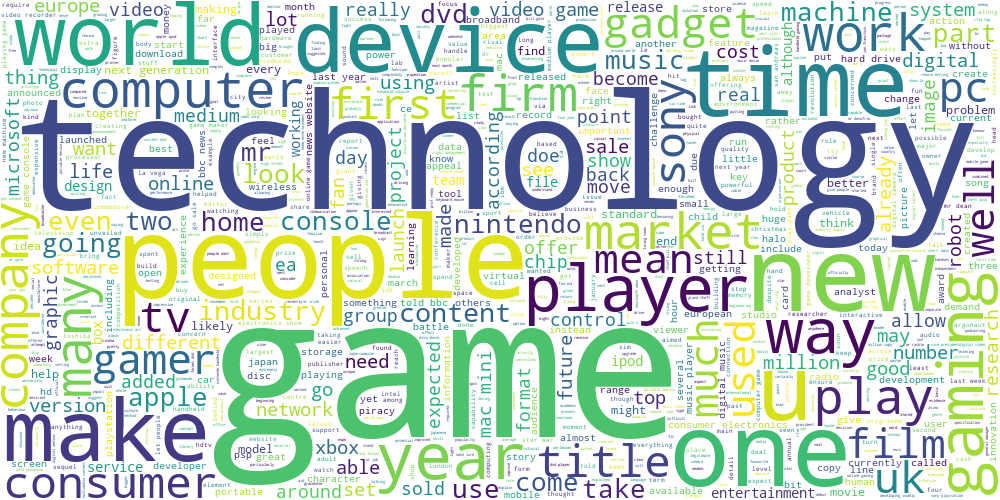

In [98]:
draw_wordcloud(data[data['labels'] == labels[4]]['text'])# Игры

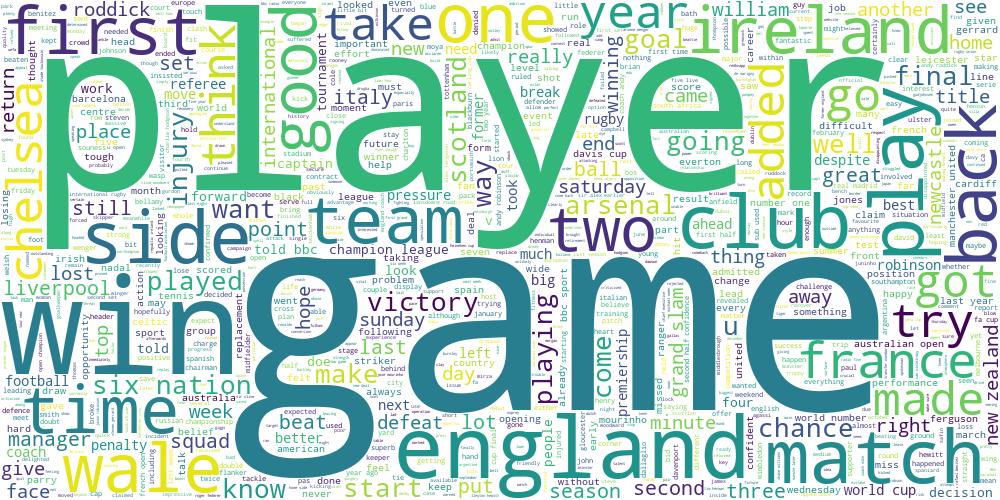

In [99]:
draw_wordcloud(data[data['labels'] == labels[5]]['text'])# Спорт Англии

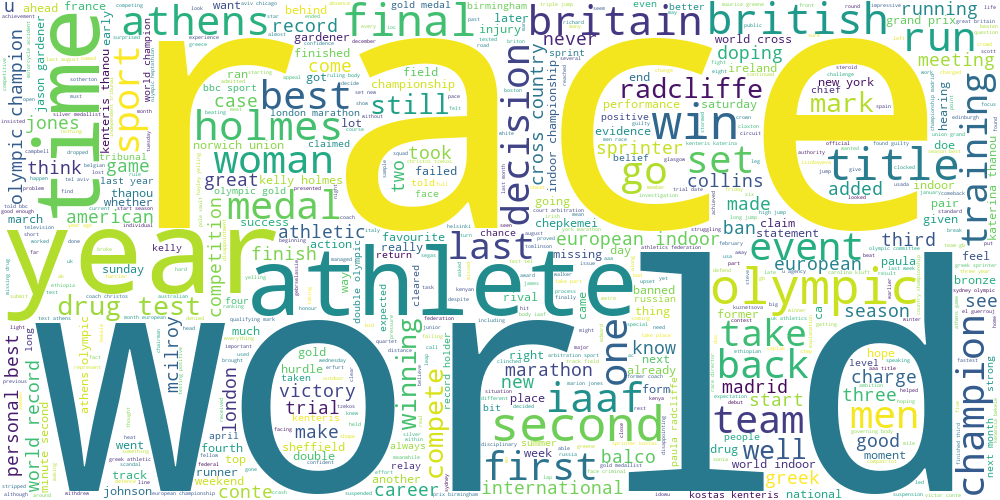

In [100]:
draw_wordcloud(data[data['labels'] == labels[6]]['text']) #Ещё один спорт??

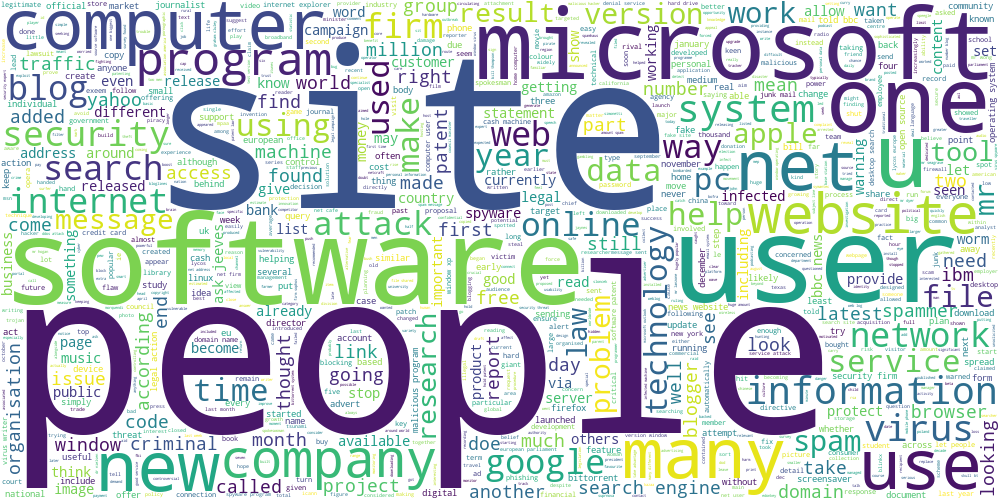

In [101]:
draw_wordcloud(data[data['labels'] == labels[7]]['text'])# Технологии(ещё одни)

В целом хорошие, однако есть какие-то повторяющиеся.

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:**

In [102]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
inverse_vocab = {index: word for word, index in tfidf_vectorizer.vocabulary_.items()}#Жестко нагуглил что есть вокабуляр

# Для каждого кластера выводим наиболее важное слово в его центре
for cluster_num, center in enumerate(kmeans.cluster_centers_):
    most_important_word_index = np.argmax(center)
    most_important_word = inverse_vocab[most_important_word_index]
    print(f"Наиболее важное слово для центра кластера {cluster_num} - '{most_important_word}'")

Наиболее важное слово для центра кластера 0 - 'mr'
Наиболее важное слово для центра кластера 1 - 'company'
Наиболее важное слово для центра кластера 2 - 'olympic'
Наиболее важное слово для центра кластера 3 - 'game'
Наиболее важное слово для центра кластера 4 - 'software'
Наиболее важное слово для центра кластера 5 - 'game'
Наиболее важное слово для центра кластера 6 - 'film'
Наиболее важное слово для центра кластера 7 - 'mobile'


Из смешного, ахахахах Слово Mr для политики. В целом да, согласуются

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

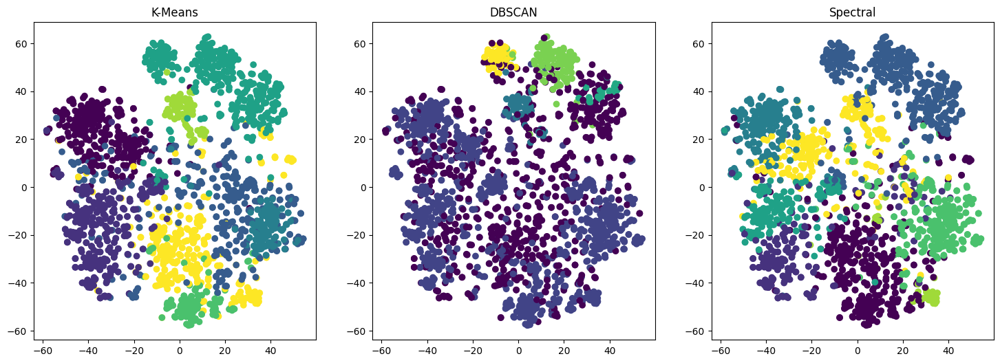

In [103]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
from sklearn.cluster import SpectralClustering
from sklearn.manifold import TSNE

tfidf_vectorizer = TfidfVectorizer(min_df= 10)
text = tfidf_vectorizer.fit_transform(data['text'])

kmeans = KMeans()
kmeans_labels = kmeans.fit_predict(text)

dbscan = DBSCAN(eps=1.24, min_samples=25)
db_labels = dbscan.fit_predict(text)

spectral = SpectralClustering(n_clusters=8, assign_labels='discretize')
spectral_labels = spectral.fit_predict(text)


text_tsne = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(text)

fig, ax = plt.subplots(1, 3, figsize=(18, 6)) #Ну тут спросил у чата ГэПэтэ как красиво нарисовать картиночки

# K-Means
ax[0].scatter(text_tsne.T[0], text_tsne.T[1], c=kmeans.labels_)
ax[0].set_title('K-Means')

# DBSCAN
ax[1].scatter(text_tsne.T[0], text_tsne.T[1], c=dbscan.labels_)
ax[1].set_title('DBSCAN')

# Spectral Clustering
ax[2].scatter(text_tsne.T[0], text_tsne.T[1], c=spectral.labels_)
ax[2].set_title('Spectral')

plt.show()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** Ну достаточно странный. У DBScan вообще беды какие-то, либо один ОГРОМНЫЙ класс, либо ОГРОМНОЕ кол-во выбросов. У Спектрального анализа всё достаточно сбалансировано. У K-means как и всегда всё красиво и сошлось, так как данные однородные.В целом, результаты соотносятся.

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:**

In [104]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Преобразование текстов в мешок слов
count_vectorizer = CountVectorizer(min_df=10, stop_words='english')

X = count_vectorizer.fit_transform(data['text'])

# Обучение модели LDA
lda = LatentDirichletAllocation(n_components=22, random_state=322)

# Получение распределения тем для каждого текста
text_topic_distribution = lda.fit_transform(X)

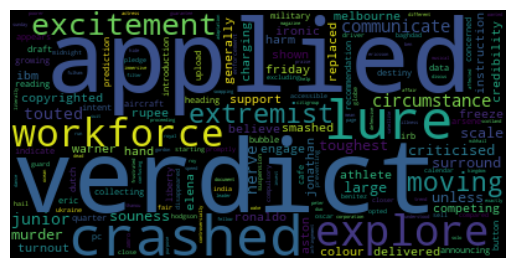

In [105]:
word_weights = {}
voc = list(count_vectorizer.vocabulary_.keys())
comp = lda.components_[4]

for i in range(len(voc)):
    word_weights[voc[i]] = comp[i]

wordcloud = WordCloud()
wordcloud.generate_from_frequencies(word_weights)

plt.imshow(wordcloud, interpolation='bilinear')#Тема: судебный приговор по делу.
plt.axis("off")
plt.show()

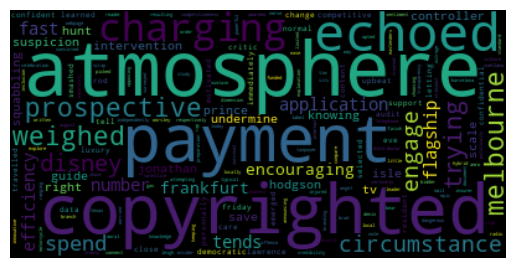

In [106]:
word_weights = {}
voc = list(count_vectorizer.vocabulary_.keys())
comp = lda.components_[5]

for i in range(len(voc)):
    word_weights[voc[i]] = comp[i]

wordcloud = WordCloud()
wordcloud.generate_from_frequencies(word_weights)

plt.imshow(wordcloud, interpolation='bilinear')#Скорее всего политика налогов в сфере экологии.
plt.axis("off")
plt.show()

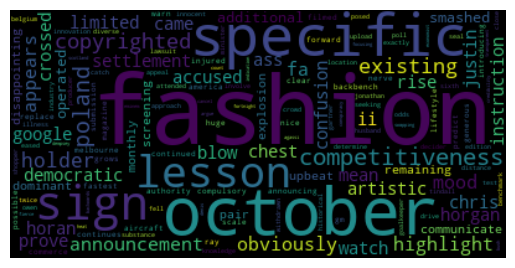

In [107]:
voc = list(count_vectorizer.vocabulary_.keys())
comp = lda.components_[15]
word_weights = {word: weight for word, weight in zip(voc, comp)}

wordcloud = WordCloud()
wordcloud.generate_from_frequencies(word_weights)

plt.imshow(wordcloud, interpolation='bilinear') #Тема показ мод
plt.axis("off")
plt.show()

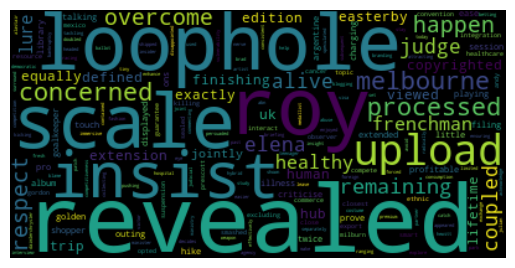

In [108]:
voc = list(count_vectorizer.vocabulary_.keys())
comp = lda.components_[19]
word_weights = {word: weight for word, weight in zip(voc, comp)}
wordcloud = WordCloud()
wordcloud.generate_from_frequencies(word_weights)

plt.imshow(wordcloud, interpolation='bilinear') #Тема судебный процесс.
plt.axis("off")
plt.show()

Темы стали гораздо уже, однако не понятно, потеряли мы качество или нет, так как в word cloud заскакивают не очень относящиеся слова.

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [113]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


# Разделение на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(data['text'], data['category'], test_size=0.2, random_state=322)

# Логистическая регрессия на tf-idf признаках
log_reg_tfidf = LogisticRegression()
Train_tfidf = tfidf_vectorizer.fit_transform(X_train)
Test_tfidf = tfidf_vectorizer.transform(X_test)
log_reg_tfidf.fit(Train_tfidf, y_train)
y_pred_tfidf_train = log_reg_tfidf.predict(Train_tfidf)
y_pred_tfidf_test = log_reg_tfidf.predict(Test_tfidf)
accuracy_tfidf_train = accuracy_score(y_train, y_pred_tfidf_train)
accuracy_tfidf_test = accuracy_score(y_test, y_pred_tfidf_test)

# K-Means на tf-idf признаках
kmeans_logreg = KMeans()
kmeans_logreg.fit(Train_tfidf)
distances_train = kmeans_logreg.transform(Train_tfidf)
distances_test = kmeans_logreg.transform(Test_tfidf)
log_reg_kmeans = LogisticRegression()
log_reg_kmeans.fit(distances_train, y_train)
y_pred_kmeans_train = log_reg_kmeans.predict(distances_train)
y_pred_kmeans_test = log_reg_kmeans.predict(distances_test)
accuracy_kmeans_train = accuracy_score(y_train, y_pred_kmeans_train)
accuracy_kmeans_test = accuracy_score(y_test, y_pred_kmeans_test)

# Латентное размещение Дирихле + логистическая регрессия на вероятностях тем
log_reg_lda = LogisticRegression()
count_vectorizer = CountVectorizer(min_df=10, stop_words='english')
x_train = count_vectorizer.fit_transform(X_train)
x_test = count_vectorizer.transform(X_test)
lda = LatentDirichletAllocation(n_components=22, random_state=322)
LDA_train = lda.fit_transform(x_train)
LDA_test = lda.transform(x_test)
log_reg_lda.fit(LDA_train, y_train)
y_pred_lda_train = log_reg_lda.predict(LDA_train)
y_pred_lda_test = log_reg_lda.predict(LDA_test)
accuracy_lda_train = accuracy_score(y_train, y_pred_lda_train)
accuracy_lda_test = accuracy_score(y_test, y_pred_lda_test)

print("Accuracy на обучающей выборке:")
print("Логистическая регрессия на tf-idf признаках:", accuracy_tfidf_train)
print("K-Means на tf-idf признаках + логистическая регрессия:", accuracy_kmeans_train)
print("Латентное размещение Дирихле + логистическая регрессия:", accuracy_lda_train)

print("\nAccuracy на тестовой выборке:")
print("Логистическая регрессия на tf-idf признаках:", accuracy_tfidf_test)
print("K-Means на tf-idf признаках + логистическая регрессия:", accuracy_kmeans_test)
print("Латентное размещение Дирихле + логистическая регрессия:", accuracy_lda_test)

Accuracy на обучающей выборке:
Логистическая регрессия на tf-idf признаках: 0.994943820224719
K-Means на tf-idf признаках + логистическая регрессия: 0.9
Латентное размещение Дирихле + логистическая регрессия: 0.9415730337078652

Accuracy на тестовой выборке:
Логистическая регрессия на tf-idf признаках: 0.9842696629213483
K-Means на tf-idf признаках + логистическая регрессия: 0.8831460674157303
Латентное размещение Дирихле + логистическая регрессия: 0.9617977528089887


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:**
Интересно, что на тесте очень хорошо себя показала самая простая модель. Возможно, это связано с тем, что тексты хорошо сбалансированы.

Модель, основанная на K-Means на tf-idf признаках показала наихудшее качество. Скорее всего это связано с тем, что K-means не умеет точно разделять текстовые данные, и классификатор на расстояниях до центров кластеров не смог улучшить эту ситуацию.

Модель на LDA показа себя хорошо, наверное, когда прослеживаются явные смысловые структуры, это будет хорошим решением, однако тут - красота в простоте.

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

In [114]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿
X_labeled, X_unlabeled, y_labeled, y_unlabeled = train_test_split(X_train, y_train, test_size=0.65, random_state=322)
X_labeled, X_valid, y_labeled, y_valid = train_test_split(X_labeled, y_labeled, test_size=0.85, random_state=322)

log_reg_tfidf = LogisticRegression()
Train_tfidf = tfidf_vectorizer.fit_transform(X_unlabeled)
Test_tfidf = tfidf_vectorizer.transform(X_labeled)
log_reg_tfidf.fit(Train_tfidf, y_train)
y_pred_tfidf_train = log_reg_tfidf.predict(Train_tfidf)
y_pred_tfidf_test = log_reg_tfidf.predict(Test_tfidf)
accuracy_tfidf_train = accuracy_score(y_train, y_pred_tfidf_train)
accuracy_tfidf_test = accuracy_score(y_test, y_pred_tfidf_test)

# K-Means на tf-idf признаках
kmeans_logreg = KMeans()
kmeans_logreg.fit(Train_tfidf)
distances_train = kmeans_logreg.transform(Train_tfidf)
distances_test = kmeans_logreg.transform(Test_tfidf)
log_reg_kmeans = LogisticRegression()
log_reg_kmeans.fit(distances_train, y_train)
y_pred_kmeans_train = log_reg_kmeans.predict(distances_train)
y_pred_kmeans_test = log_reg_kmeans.predict(distances_test)
accuracy_kmeans_train = accuracy_score(y_train, y_pred_kmeans_train)
accuracy_kmeans_test = accuracy_score(y_test, y_pred_kmeans_test)

# Латентное размещение Дирихле + логистическая регрессия на вероятностях тем
log_reg_lda = LogisticRegression()
count_vectorizer = CountVectorizer(min_df=10, stop_words='english')
x_train = count_vectorizer.fit_transform(X_train)
x_test = count_vectorizer.transform(X_test)
lda = LatentDirichletAllocation(n_components=22, random_state=322)
LDA_train = lda.fit_transform(x_train)
LDA_test = lda.transform(x_test)
log_reg_lda.fit(LDA_train, y_train)
y_pred_lda_train = log_reg_lda.predict(LDA_train)
y_pred_lda_test = log_reg_lda.predict(LDA_test)
accuracy_lda_train = accuracy_score(y_train, y_pred_lda_train)
accuracy_lda_test = accuracy_score(y_test, y_pred_lda_test)

Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** Не успел доделать, сориииии((((
    

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. Наконец, ставший ежегодной традицией социализационный бонус. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за это задание, сходите на какую-нибудь выставку или в музей, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

In [ ]:
# YOUR CODE HERE (ノಠ益ಠ)ノ彡┻━┻